# First Glimpse of the DC2 ImSim Image Differencing with Gen3 DRP Pipeline
# 1.5 yr depth tracts 3828 and 3829

### A tour of number counts

*TL;DR as of May 26th, my top priority over the next couple weeks is template generation*

Like https://github.com/yalsayyad/dm_notebooks/blob/master/examples/DiaSourceCensusCcdVisitNight-HSC-RC2.ipynb, this is an exploration of diaSource counts per visit/CCD/Visit but with the newly processed DC2 data:
    

## Background: Image differencing in the stack

* 2013 "Preconvolution" test with simulated and Stripe 82 data: [Becker et al 2013]( https://docushare.lsst.org/docushare/dsweb/Get/LDM-227)
* 2016  with Decam Data: https://dmtn-006.lsst.io/
* 2016 "Decorrelation" test with simulated and decam data. https://dmtn-021.lsst.io/




# 1) Data

ugrizy-band data in the monthly reprocessed `med-test-1`: 

* `collections='u/yusra/diaSourceTable2'`:  PARENT_REPO = `2.2i/runs/test-med-1/w_2021_16/DM-29899`. This was run before the Parquet DiaSourceTables were added to the DRP pipeline. I ran those two steps into: `collections='u/yusra/diaSourceTable2'` The relevant dataset is a per-visit `DiaSourceTable` (this dataset type will probably be renamed to `diaSourceTable` (DM-30212) when it hits master in w22. 
* collection = 'u/yusra/w_2021_20_test-med: PARENT_REPO = `2.2i/runs/test-med-1/w_2021_20/DM-30282`  The relevant dataset is a per-visit `diaSourceTable`

What's missing: 
* Source Association. On its way.

## Geometry

* The tracts are smaller. This means tract overlap will be very important. 

### Conclusion (1) we should run templates per tract, but then do difference imaging per visit and have the registry pull the tracts that overlap each visit. 
* TO DO: put templateGen in with the step3/multivisit subsets. And have a per-visit subset for image diff and forced photometry. 


i-band visit 211099


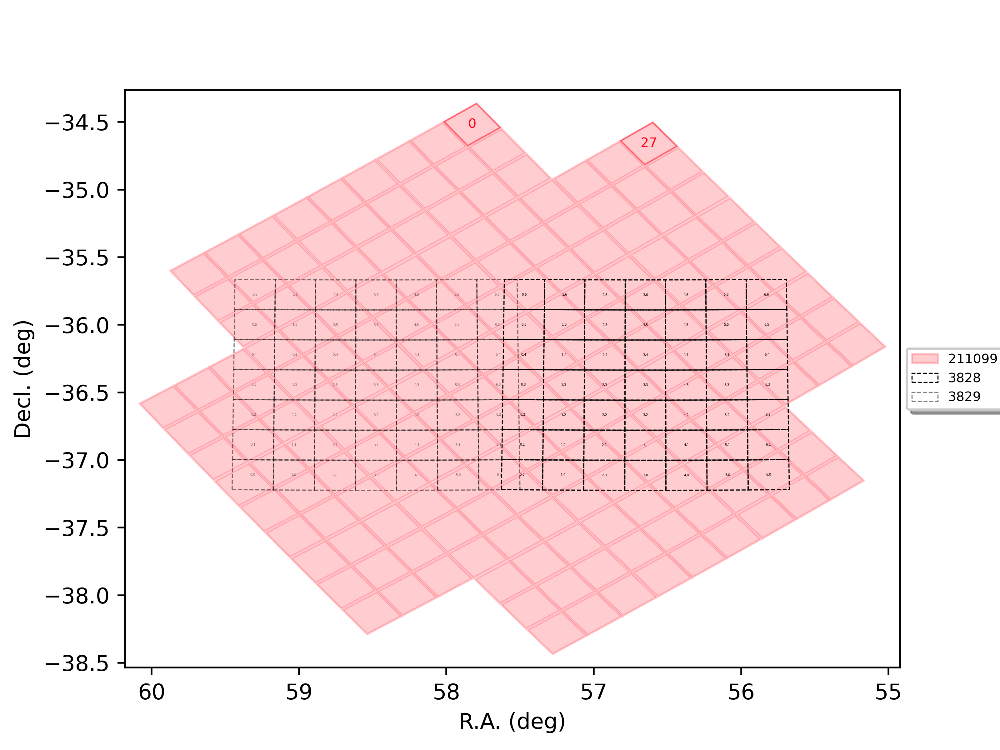

In [1]:
from IPython.display import Image
print("i-band visit 211099")
Image("https://lsst-web.ncsa.illinois.edu/~yusra/download/211099.png", width=1000)

u-band visit 2336


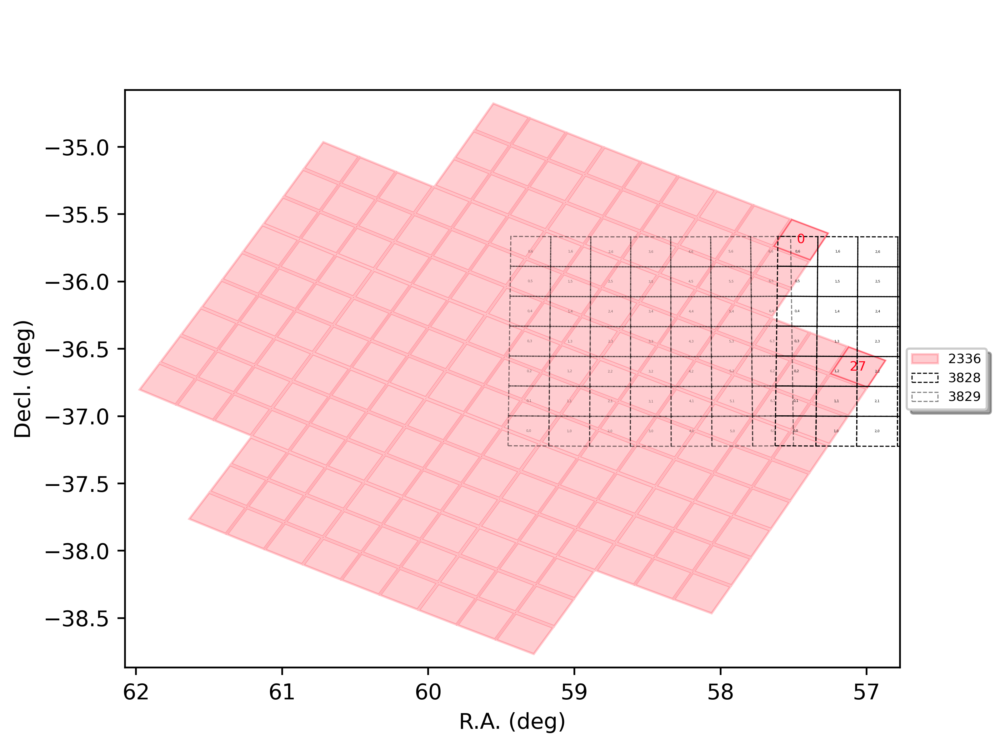

In [2]:
from IPython.display import Image
print("u-band visit 2336")
Image("https://lsst-web.ncsa.illinois.edu/~yusra/download/2336.png", width=1000)

![HSC CCD Layout](https://hsc.mtk.nao.ac.jp/pipedoc_e/_images/CCDPosition_20140811-1.png)


## Load and Transform Data

In [40]:
import os
import numpy as np

import scipy
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
import lsst.afw.display as afw_display
import lsst.geom
afwDisplay.setDefaultBackend('matplotlib')
import matplotlib.ticker as plticker
import lsst.afw.cameraGeom.testUtils as testUtils
import lsst.afw.cameraGeom as cameraGeom
from lsst.obs.hsc import HscMapper as mapper
import lsst.daf.butler as dafButler
from skimage.filters import gaussian
from lsst.ap.association import UnpackApdbFlags, TransformDiaSourceCatalogConfig
import pandas as pd
from operator import itemgetter
from itertools import groupby
os.environ['PGPASSFILE'] = "/home/yusra/.lsst/.pgpassfile"

In [4]:
import lsst.daf.butler as dafButler
PARENT_REPO = "2.2i/runs/test-med-1/w_2021_16/DM-29899"
COLLECTION = 'u/yusra/w_2021_20_test-med' #20
#COLLECTION = 'u/yusra/diaSourceTable2' #w16
butler = dafButler.Butler('/repo/dc2', collections=COLLECTION)

In [5]:
visits =  butler.registry.queryDataIds(["visit", "band"], datasets="diaSourceTable", collections=COLLECTION, where="instrument='LSSTCam-imSim'")

In [6]:
tuples = set([(dataId['band'], dataId['visit']) for dataId in visits])
len(tuples)

330

In [7]:
visitDict =  {key: [] for key in set(dataId['band'] for dataId in visits)}
#for band, visit in tuples:
for k, v in tuples:
    visitDict[k].append(v)
    
for k, v in visitDict.items():
    visitDict[k] =  list(set(v))

tables = []
for k, visits in visitDict.items():
    for v in visits:
        tables.append(butler.get('diaSourceTable', dataId={'visit': v}))

df = pd.concat(tables)

In [8]:
config = TransformDiaSourceCatalogConfig()
unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')
flag_values = unpacker.unpack(df['flags'], 'flags')
flag_names = list(flag_values.dtype.names)

flags = pd.DataFrame(flag_values, index=df.index)
df = pd.concat([df, flags], axis=1)
print("List of available flags: ", flags.columns)

List of available flags:  Index(['base_PixelFlags_flag', 'base_PixelFlags_flag_offimage',
       'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_interpolated',
       'base_PixelFlags_flag_saturated', 'base_PixelFlags_flag_cr',
       'base_PixelFlags_flag_bad', 'base_PixelFlags_flag_suspect',
       'base_PixelFlags_flag_interpolatedCenter',
       'base_PixelFlags_flag_saturatedCenter', 'base_PixelFlags_flag_crCenter',
       'base_PixelFlags_flag_suspectCenter', 'slot_Centroid_flag',
       'slot_Centroid_pos_flag', 'slot_Centroid_neg_flag', 'slot_ApFlux_flag',
       'slot_ApFlux_flag_apertureTruncated', 'slot_PsfFlux_flag',
       'slot_PsfFlux_flag_noGoodPixels', 'slot_PsfFlux_flag_edge',
       'ip_diffim_forced_PsfFlux_flag',
       'ip_diffim_forced_PsfFlux_flag_noGoodPixels',
       'ip_diffim_forced_PsfFlux_flag_edge', 'slot_Shape_flag',
       'slot_Shape_flag_unweightedBad', 'slot_Shape_flag_unweighted',
       'slot_Shape_flag_shift', 'slot_Shape_flag_maxIter',
       

In [9]:
instrumentDataId = butler.registry.expandDataId(instrument='LSSTCam-imSim')
packer = butler.registry.dimensions.makePacker("visit_detector", instrumentDataId)
df['visit'] = df.ccdVisitId.apply(lambda x: packer.unpack(x)['visit'])
df['detector'] = df.ccdVisitId.apply(lambda x: packer.unpack(x)['detector'])


In [10]:
# create some derived columns

pixToArcseconds = 0.2
PIXEL_SCALE = 0.2
SIGMA2FWHM = 2*np.sqrt(2*np.log(2))
traceRadius = np.sqrt(0.5) * np.sqrt(df.IxxPsf + df.IyyPsf)
df['seeing'] = SIGMA2FWHM * traceRadius

bbox = butler.get('goodSeeingDiff_differenceExp.bbox', visit = 471987 , detector=5)
wcs = butler.get('goodSeeingDiff_differenceExp.wcs', visit = 471987 , detector=5)
APPROX_CCD_AREA = bbox.getArea()*wcs.getPixelScale().asDegrees()**2

In [11]:
# get Focal Plane Coordinates (is there a faster way to do this?)
camera = butler.get('camera', instrument='LSSTCam-imSim')

def ccd2focalPlane(x, y, ccd):
    cc = int(ccd)
    det = camera[cc]
    point = det.transform(lsst.geom.Point2D(x, y), cameraGeom.PIXELS, cameraGeom.FOCAL_PLANE)
    return point[0], point[1]

vecCcd2FP =  np.vectorize(ccd2focalPlane)
focal_plane = vecCcd2FP(df['x'].values.astype(float), df['y'].values.astype(float), df['detector'].values.astype(int))
df['xFP'] = focal_plane[0]
df['yFP'] = focal_plane[1]

In [12]:
pixelFlagNames = [
       'base_PixelFlags_flag_offimage',
       'base_PixelFlags_flag_edge',
       'base_PixelFlags_flag_interpolated',
       'base_PixelFlags_flag_saturated',
       'base_PixelFlags_flag_cr',
       'base_PixelFlags_flag_bad',
       'base_PixelFlags_flag_suspect',
       'base_PixelFlags_flag_interpolatedCenter',
       'base_PixelFlags_flag_saturatedCenter',
       'base_PixelFlags_flag_crCenter',
       'base_PixelFlags_flag_suspectCenter']

centroidFlagNames = [
       'slot_Centroid_flag',
       'slot_Centroid_pos_flag',
       'slot_Centroid_neg_flag',]
    
fluxFlagNames = [
       'slot_ApFlux_flag',
       'slot_ApFlux_flag_apertureTruncated',
       'slot_PsfFlux_flag',
       'slot_PsfFlux_flag_noGoodPixels',
       'slot_PsfFlux_flag_edge',
       'ip_diffim_forced_PsfFlux_flag',
       'ip_diffim_forced_PsfFlux_flag_noGoodPixels',
       'ip_diffim_forced_PsfFlux_flag_edge']

shapeFlagNames = [
       'slot_Shape_flag',
       'slot_Shape_flag_unweightedBad',
       'slot_Shape_flag_unweighted',
       'slot_Shape_flag_shift',
       'slot_Shape_flag_maxIter',
       'slot_Shape_flag_psf']


In [13]:
def plot2axes(x1, y1, x2, y2, xlabel, ylabel1, ylabel2, title=None):
    fig, ax1 = plt.subplots(figsize=(16,6))
    color = 'tab:red'
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(ylabel1, color=color)
    a = np.arange(len(x1))
    ax1.plot(a, y1, color=color)
    ax1.xaxis.set_ticks(a) #set the ticks to be a
    ax1.xaxis.set_ticklabels(x1)
    
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel(ylabel2, color=color)  # we already handled the x-label with ax1
    ax2.plot(a, y2, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    for label in ax1.get_xticklabels():
        label.set_ha("right")
        label.set_rotation(90)
    if title:
        fig.suptitle(title)
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

# 2)  DiaSources per visit

A few different ways to look at false positives as a function of visits. Most of the variance in diaSources can be explained by the seeing. If the visit PSF is smaller than the template PSF, the template PSF is deconvolved, in which any inaccuracy in the PSF model is amplified. This causes the clear relationship below where false positives improve as the PSF size increases:

In [14]:
df

,diaSourceId,ccdVisitId,filterName,diaObjectId,parentDiaSourceId,midPointTai,pixelId,bboxSize,flags,ra,...,slot_Shape_flag_unweightedBad,slot_Shape_flag_unweighted,slot_Shape_flag_shift,slot_Shape_flag_maxIter,slot_Shape_flag_psf,visit,detector,seeing,xFP,yFP
0,112222724272685101,209031113,z,0,0,59862.338622,0,13,0,57.445719,...,False,False,False,False,False,209031,113,0.525812,312.985303,-19.885033
1,112222724272685102,209031113,z,0,0,59862.338622,0,13,0,57.413663,...,False,False,False,False,False,209031,113,0.525832,310.476294,-15.755605
2,112222724272685103,209031113,z,0,0,59862.338622,0,15,25165824,57.390252,...,True,False,False,False,False,209031,113,0.525866,305.987036,-15.385834
3,112222724272685104,209031113,z,0,0,59862.338622,0,17,0,57.396069,...,False,False,False,False,False,209031,113,0.525834,310.365881,-12.228636
4,112222724272685105,209031113,z,0,0,59862.338622,0,15,25165824,57.341891,...,True,False,False,False,False,209031,113,0.525908,300.455403,-10.895221
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12,3160110771732513,5886165,y,0,0,59588.093705,0,25,25165824,57.163184,...,True,False,False,False,False,5886,165,0.872107,-154.797410,262.077517
13,3160110771732514,5886165,y,0,0,59588.093705,0,72,25166620,57.172231,...,True,False,False,False,False,5886,165,0.872102,-153.854999,263.133396
14,3160110771732515,5886165,y,0,0,59588.093705,0,27,75497472,57.052819,...,False,False,True,False,False,5886,165,0.871935,-174.133634,264.416758
15,3160110771732516,5886165,y,0,0,59588.093705,0,37,25165824,57.052162,...,True,False,False,False,False,5886,165,0.871932,-174.323170,264.575298


In [15]:
# All Pixel Flags except for interpolated.
# Presumably they've been interpolated for a reason

badFlagNames =  [
 'base_PixelFlags_flag_offimage',
 'base_PixelFlags_flag_edge',
 'base_PixelFlags_flag_saturated',
 'base_PixelFlags_flag_cr',
 'base_PixelFlags_flag_bad',
 'base_PixelFlags_flag_suspect']
        
idx = flags[badFlagNames].sum(axis = 1) == 0 

idxHighSNR = idx & (df.dipMeanFlux/df.dipMeanFluxErr > 5)

In [16]:
vgrp = df.groupby('visit')
vgrpClean = df[idx].groupby('visit')

In [17]:
dgrp = df.groupby(['visit', 'detector'], as_index=False)

In [18]:
grp = dgrp.count().groupby('visit')
detPerVisit = grp.count().reset_index().sort_values(['detector'], ascending=False)[['visit','detector']]
detPerVisit.columns = ['visit', 'n_detectors']
ds = pd.merge(df, detPerVisit, left_on='visit', right_on='visit')

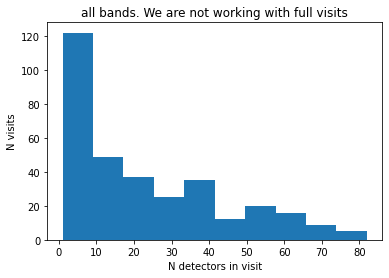

In [19]:
plt.hist(detPerVisit[['n_detectors']])
plt.ylabel('N visits')
plt.xlabel('N detectors in visit')
_ = plt.title('all bands. We are not working with full visits')

## Note: We are not working with full visits and not working with full detectors
* Number counts require area for the denominator. I've taken the visit out of the equation but we need the coverage of the detector as a QA statistic too. See i-band analysis only for more accurate number counts. 

### Conclusion 2) Let's put the fraction of the image with data in a catalog or butler-gettable metadata.

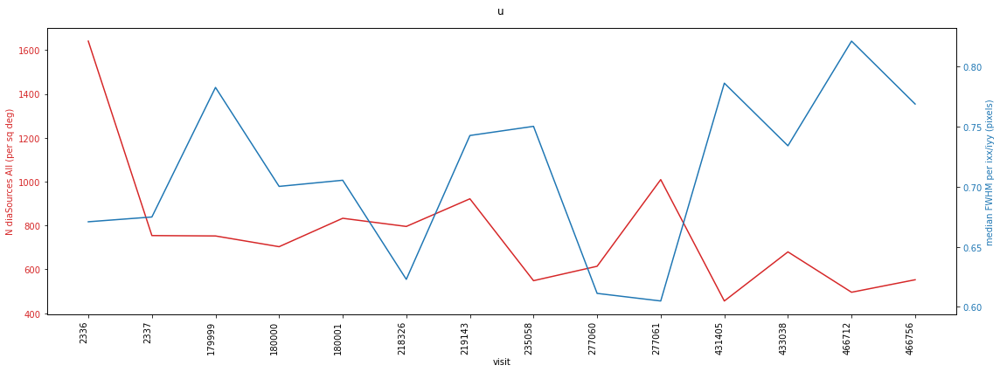

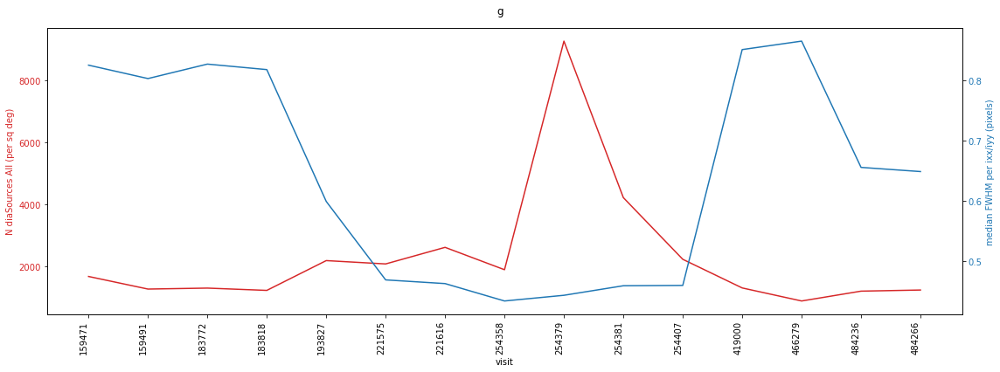

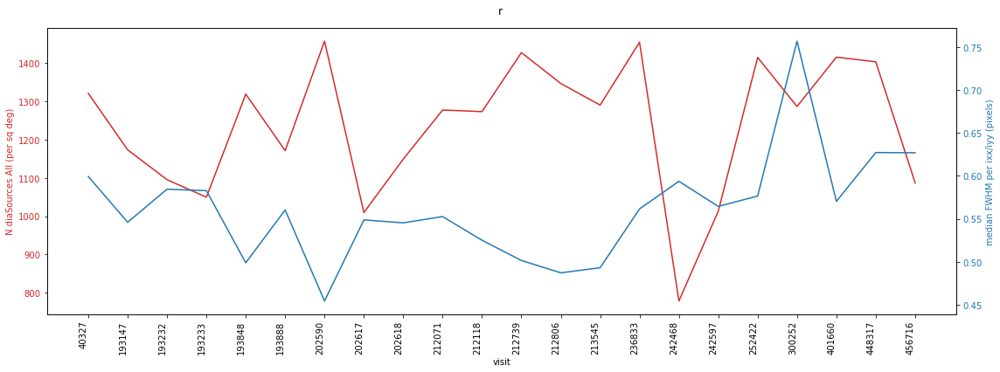

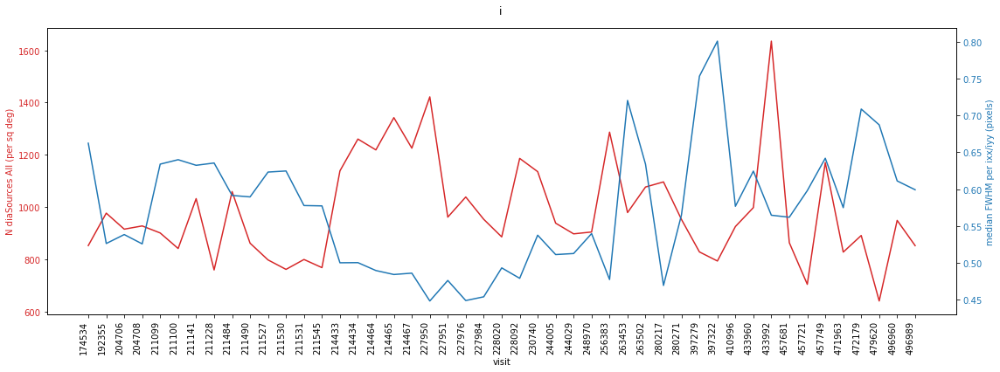

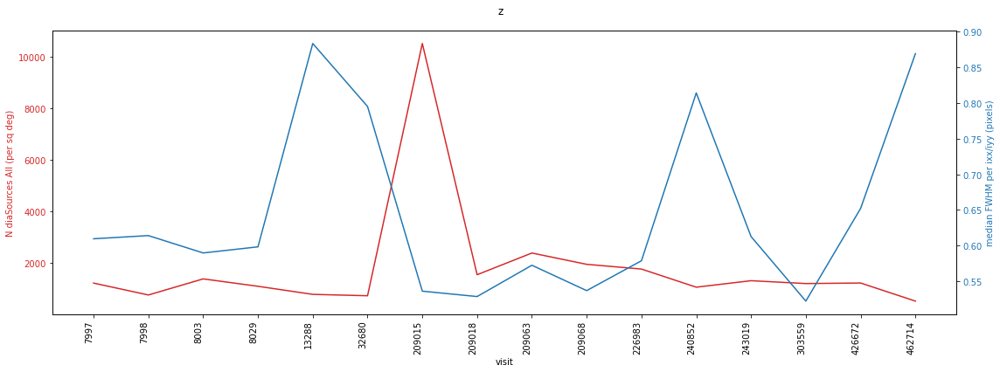

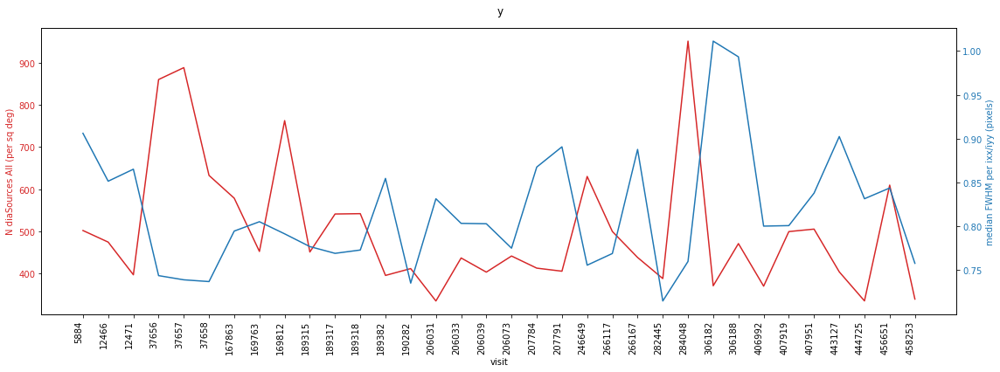

In [20]:
MIN_DETECTORS = 20
for band in 'ugrizy':
    vgrp = ds[(ds.filterName == band) & (ds.n_detectors > MIN_DETECTORS)].groupby('visit')
    plot2axes(vgrp.visit.first().values, vgrp.detector.count().values/vgrp.n_detectors.first().values/APPROX_CCD_AREA,
          vgrp.visit.first().values, vgrp.seeing.median().values,
          'visit','N diaSources All (per sq deg)',
          'median FWHM per ixx/iyy (pixels)', title=band)

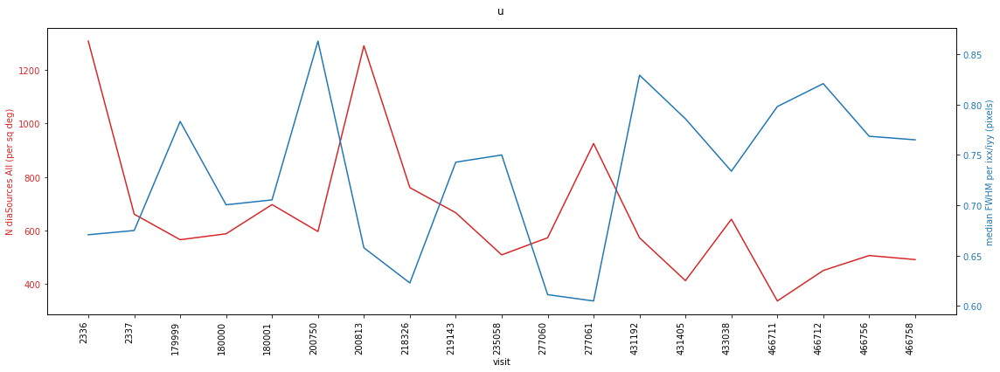

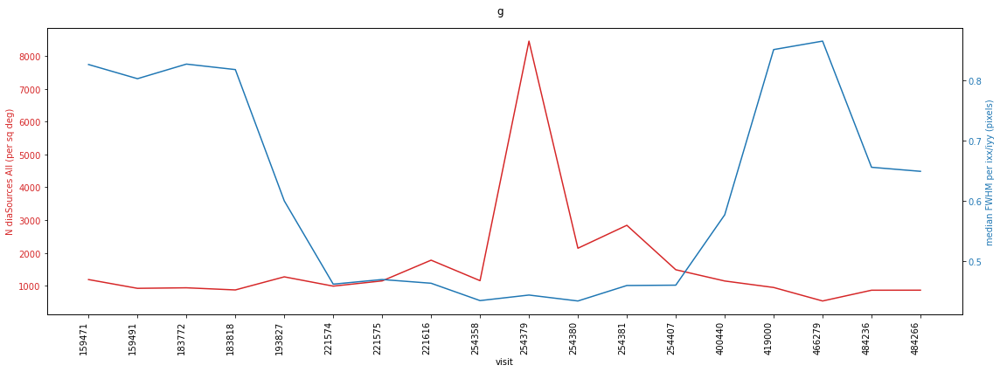

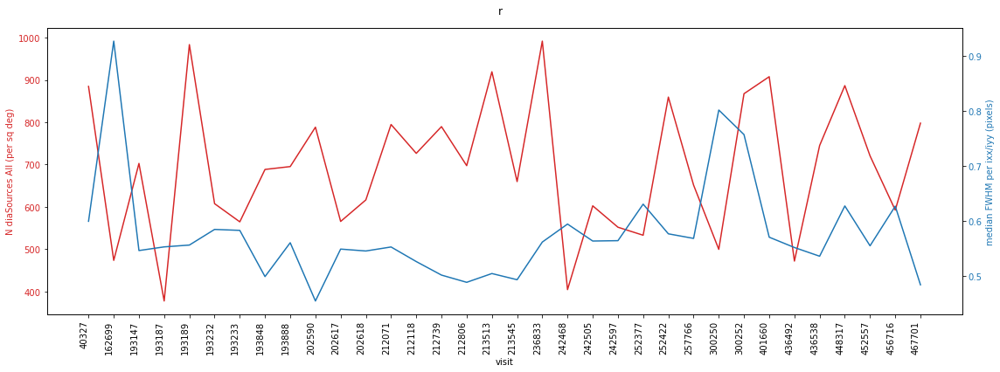

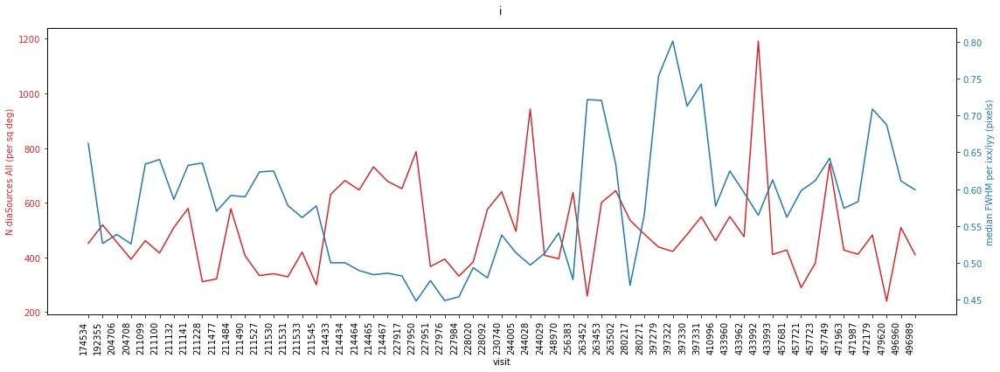

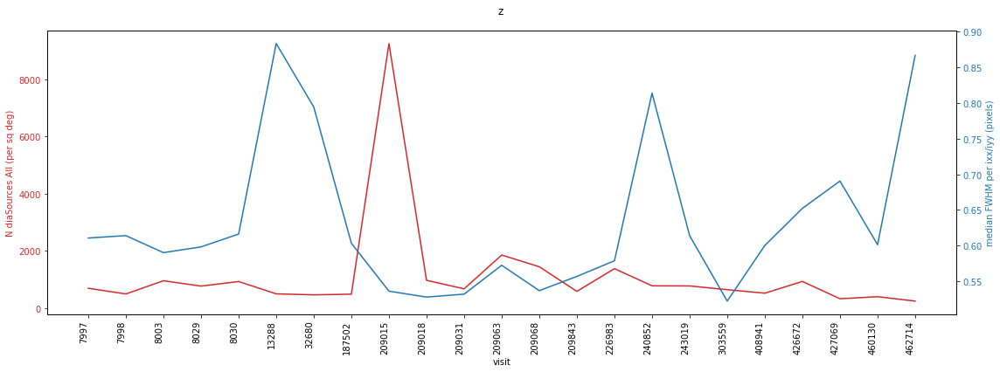

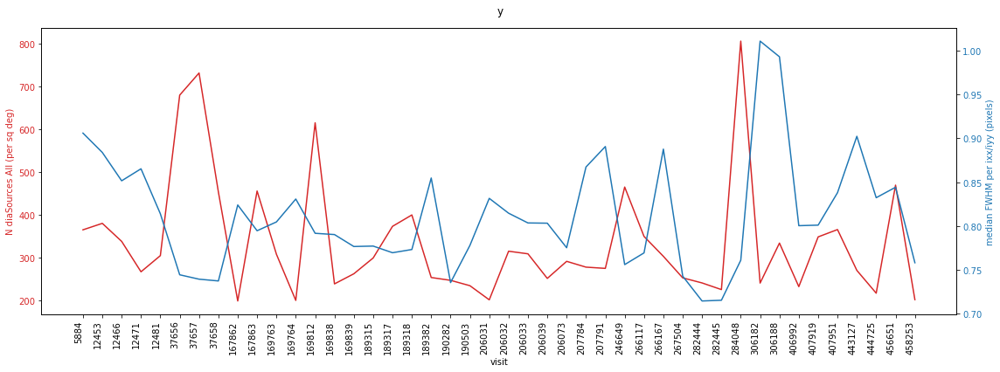

In [21]:
MIN_DETECTORS = 10
idx = ds[badFlagNames].sum(axis = 1) == 0
for band in 'ugrizy':
    vgrpClean = ds[(ds.filterName == band) & (ds.n_detectors > MIN_DETECTORS)&(idx)].groupby('visit')
    plot2axes(vgrpClean.visit.first().values, vgrpClean.detector.count().values/vgrpClean.n_detectors.first().values/APPROX_CCD_AREA,
              vgrpClean.visit.first().values, vgrpClean.seeing.median().values,
              'visit','N diaSources All (per sq deg)',
              'median FWHM per ixx/iyy (pixels)', title=band)

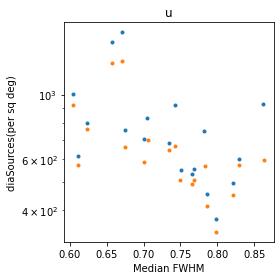

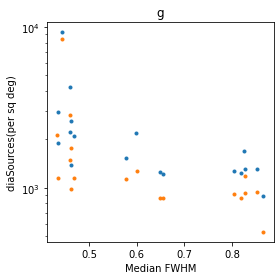

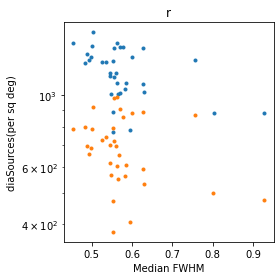

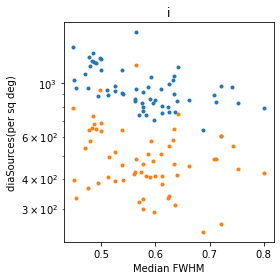

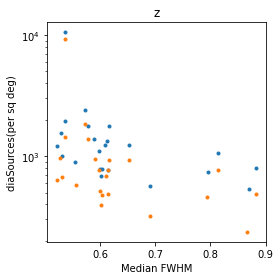

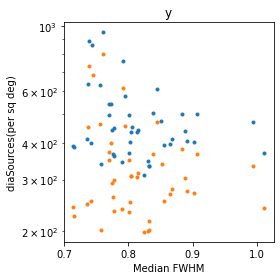

In [22]:
#templateSeeingDist = ds.seeing[ds.visit.isin(templateVisits)]
for band in 'ugrizy':
    vgrp = ds[(ds.filterName == band) & (ds.n_detectors > MIN_DETECTORS)].groupby('visit')
    plt.figure(figsize=(4,4))
    plt.title(band)
    plt.plot(vgrp.seeing.median().values, vgrp.detector.count().values/vgrp.n_detectors.first().values/APPROX_CCD_AREA,
             '.', label="ALL")
    vgrpClean = ds[(ds.filterName == band) & (ds.n_detectors > MIN_DETECTORS)&(idx)].groupby('visit')
    plt.plot(vgrpClean.seeing.median().values, vgrpClean.detector.count().values/vgrpClean.n_detectors.first().values/APPROX_CCD_AREA,
             '.', label="No Pixel Flags")
    plt.yscale('log')
    plt.ylabel('diaSources(per sq deg)')
    plt.xlabel('Median FWHM')
    plt.tight_layout()
    plt.show

In [23]:
def n(v):
    return v*np.exp(-0.5*v*v)/(2**(5/2) * np.pi**(3/2))

def expected(low, high, seeing=3, nCcds=1):
    """seeing must be supplied as sigma)
    """
    inBetween = n(low) - n(high)
    return inBetween * 2 * nCcds * bbox.getWidth()*bbox.getHeight() / (seeing**2)



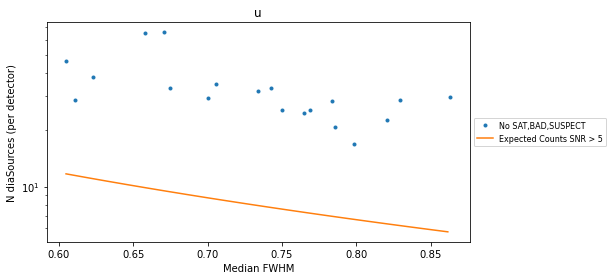

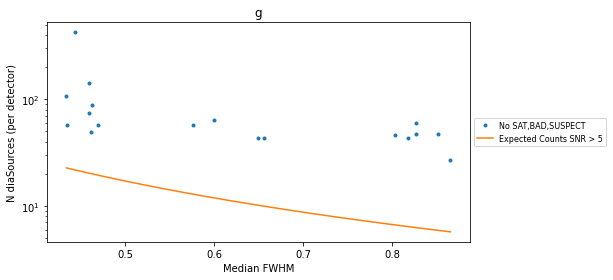

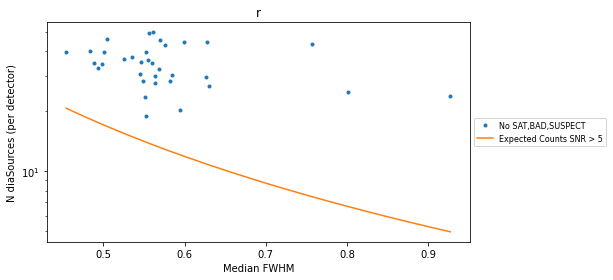

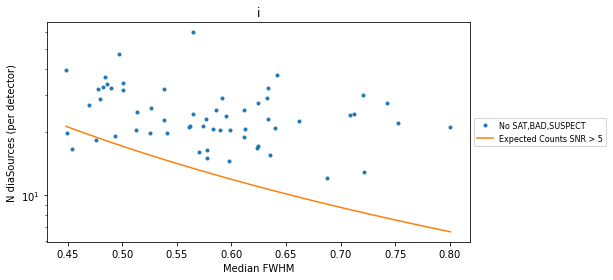

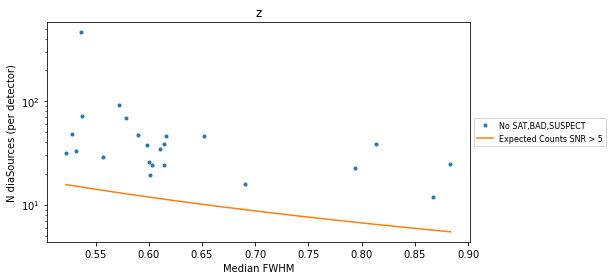

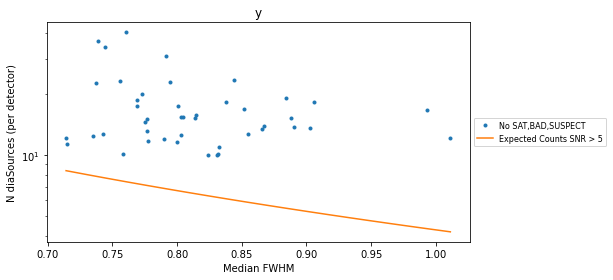

In [26]:
templateSeeingDist = ds.seeing
for band in 'ugrizy':
    vgrp = ds[(ds.filterName == band) & (ds.n_detectors > MIN_DETECTORS)].groupby('visit')
    vgrpClean = ds[(ds.filterName == band) & (ds.n_detectors > MIN_DETECTORS)&(idx)].groupby('visit')
    
    seeingRange = np.linspace(np.min(vgrp.seeing.median().values/SIGMA2FWHM/PIXEL_SCALE), 
                             np.max(vgrp.seeing.median().values/SIGMA2FWHM/PIXEL_SCALE),
                             20)
    expectedCounts = expected(5, 100, seeingRange, 1)
    plt.figure(figsize=(8,4))
    ax = plt.subplot(111)
    plt.yscale('log')
    plt.ylabel('N diaSources (per detector)')
    plt.xlabel('Median FWHM')
    plt.plot(vgrpClean.seeing.median().values, vgrpClean.detector.count().values/vgrpClean.n_detectors.first().values, '.', label="No Pixel Flags")
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.9, box.height])
    plt.plot(seeingRange*SIGMA2FWHM*PIXEL_SCALE, expectedCounts, label="Expected Counts SNR > 5")
    plt.legend(fontsize=8, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.title(band)
    plt.tight_layout()

# DiaSources per CCD

In [27]:
vgrp = ds.groupby('detector')
vgrpClean = ds[idx].groupby('detector')
#vgrpHighSNR = ds[idxHighSNR].groupby('detector')
NVisits = len(np.unique(ds['detector'].values))

In [28]:
# Get corners of the ccds. You can prob do this with camera geom too. 
cornerList = []

for det in camera:
    try:
        bbox = det.getBBox()
        ccd = det.getId()
    except:
        print(det.getId)
        continue
    cornerList.append( [int(v), ccd] + [val for pair in bbox.getCorners() for val in ccd2focalPlane(pair[0], pair[1], ccd)])


corners = pd.DataFrame(cornerList)
cornerList
corners['width'] = corners[6] - corners[8]
corners['height'] = corners[7] - corners[5]

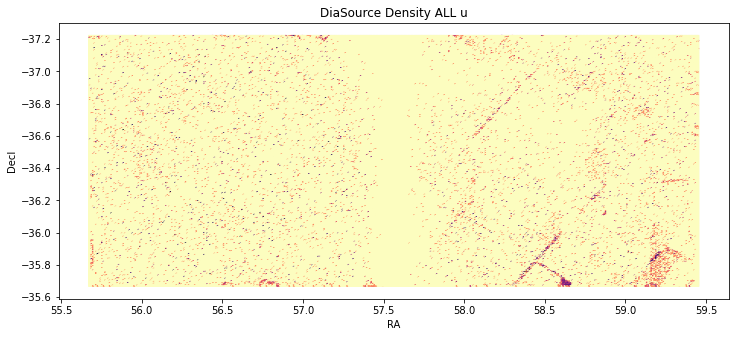

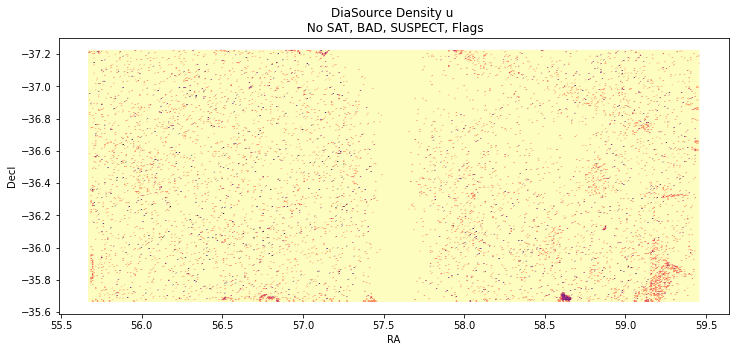

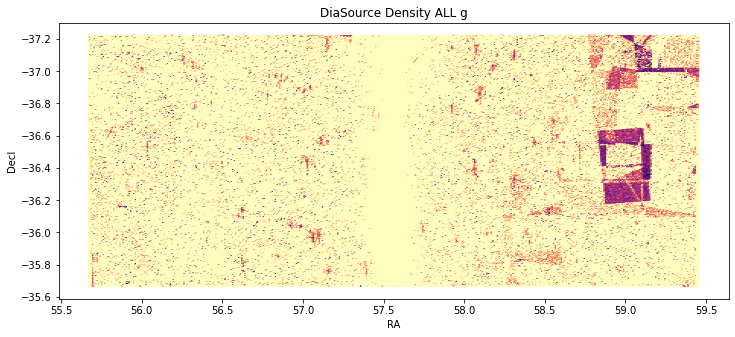

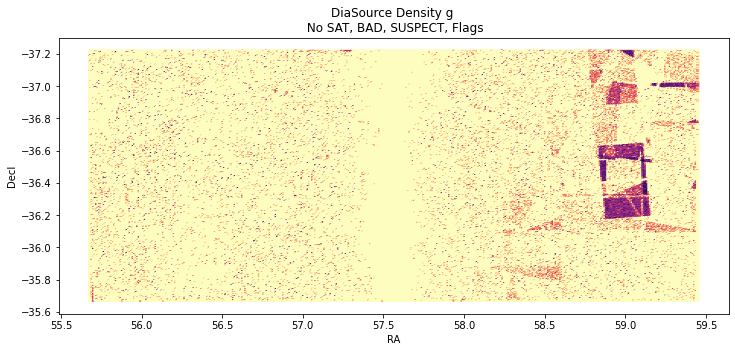

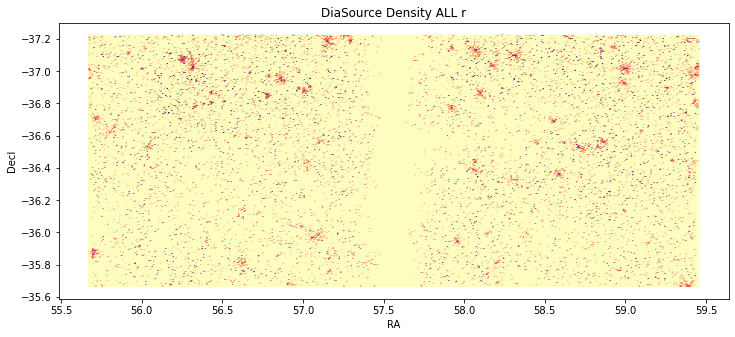

...

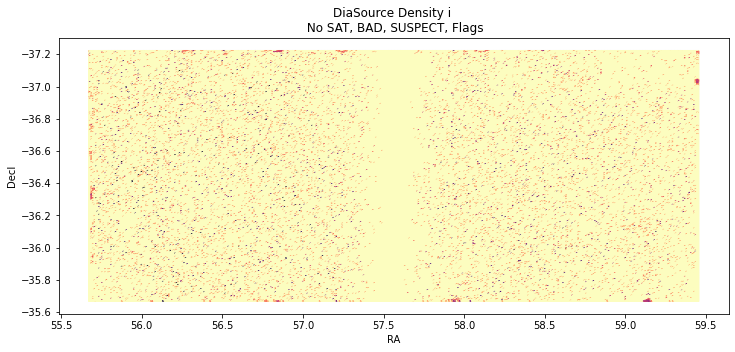

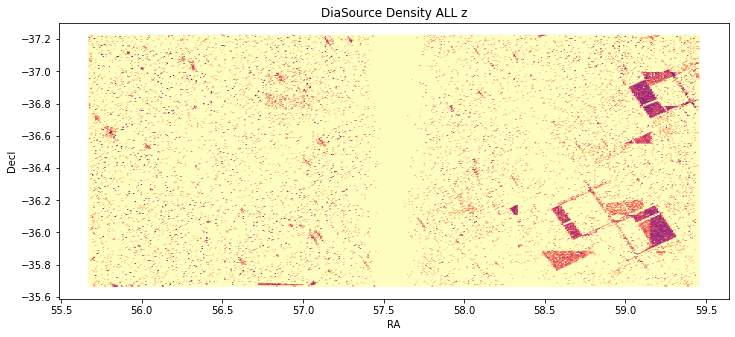

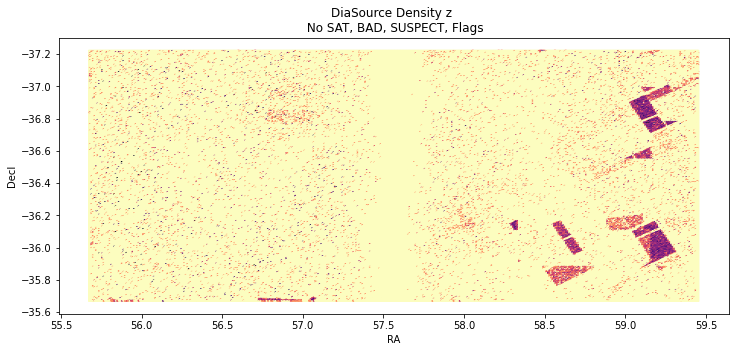

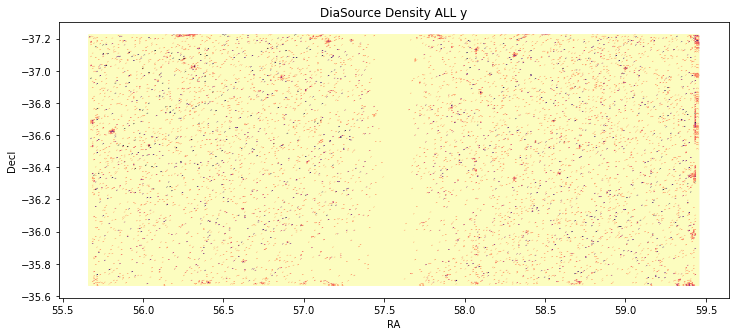

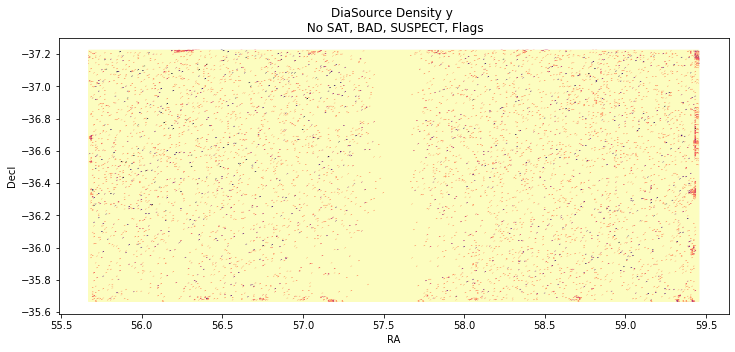

In [29]:
import matplotlib.patches as patches

for band in 'ugrizy':
    fig1 = plt.figure(figsize=(12,12))
    ax1 = fig1.add_subplot(111, aspect='equal')
    ax1.hexbin(ds[ds.filterName == band]['ra'], ds[ds.filterName == band]['decl'], gridsize=(400,400), bins='log', cmap='magma_r')
    ax1.set_title('DiaSource Density ALL %s' %(band))
    ax1.set_xlabel('RA')
    ax1.set_ylabel('Decl')
    ax1 = plt.gca()
    ax1.invert_yaxis()
    plt.show()

    for ind, title in [
                       (idx, "No SAT, BAD, SUSPECT, Flags"),
    ]:

        fig1 = plt.figure(figsize=(12,12))
        ax1 = fig1.add_subplot(111, aspect='equal')
        ax1.hexbin(ds[(ds.filterName == band) & idx]['ra'], ds[(ds.filterName == band) & idx]['decl'], gridsize=(400,400), bins='log', cmap='magma_r')
        ax1.set_title('DiaSource Density %s \n %s' %(band, title))
        ax1.set_xlabel('RA')
        ax1.set_ylabel('Decl')
        ax1 = plt.gca()
        ax1.invert_yaxis()
        plt.show()

## Conclusion:
* As we'll see below, these patches of bad imageDifferences are due to bad templates. Need to up the minimum number of visits going into the template to much higher than 3. If 3 visits touch your image, most pixels will have less than n=3 coverage. 

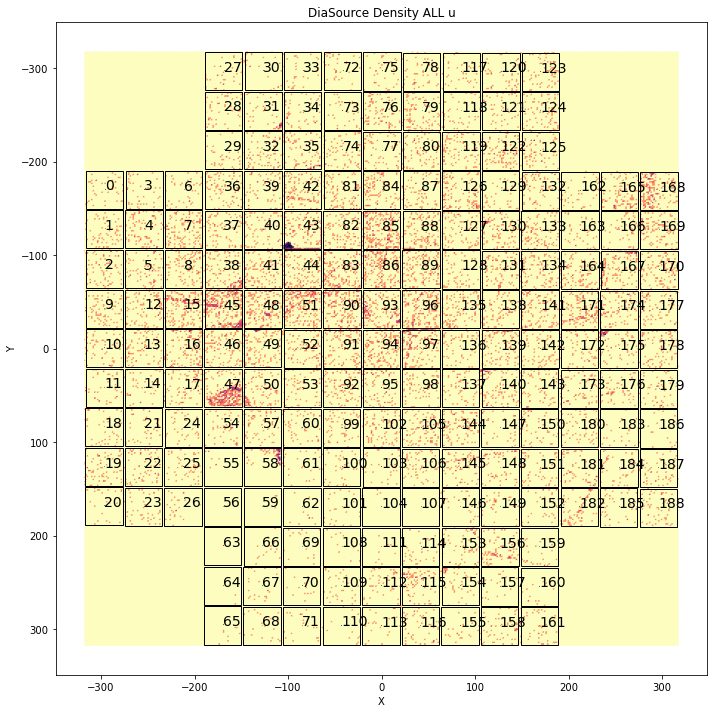

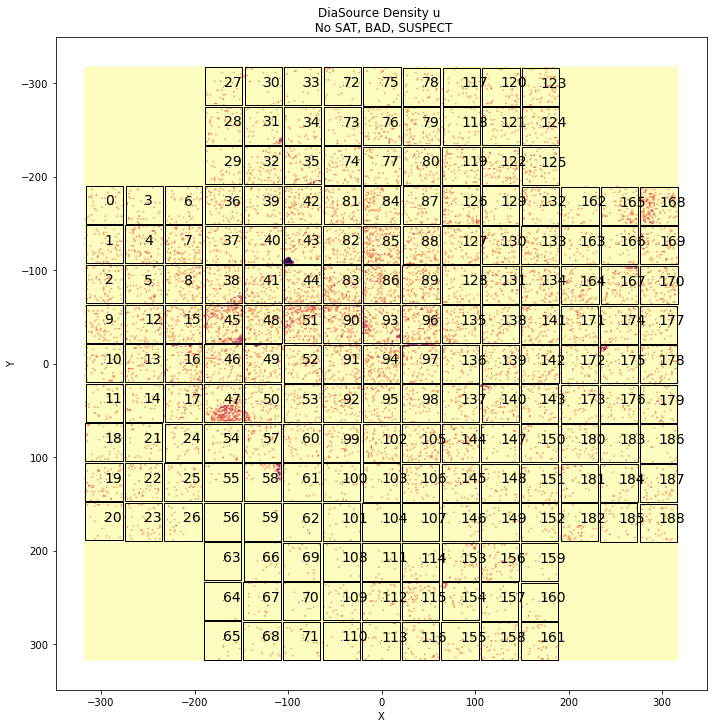

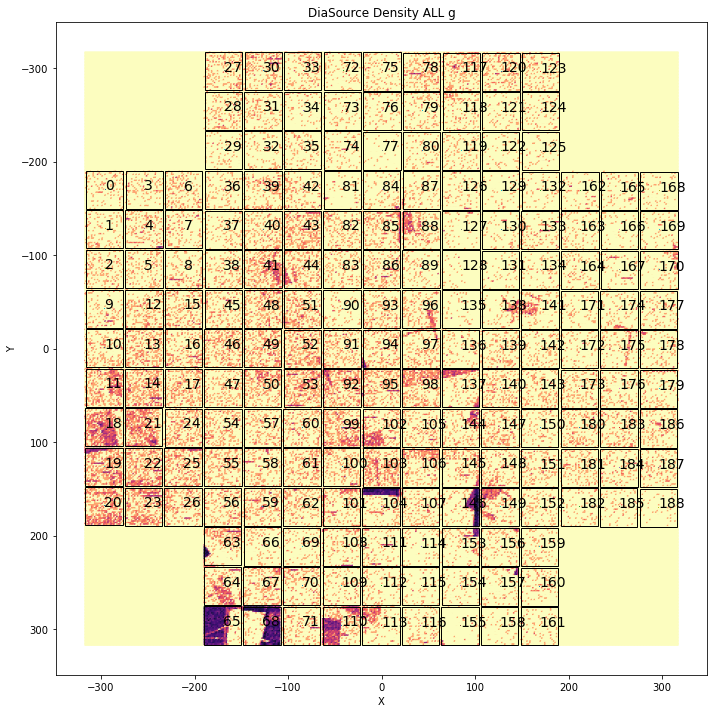

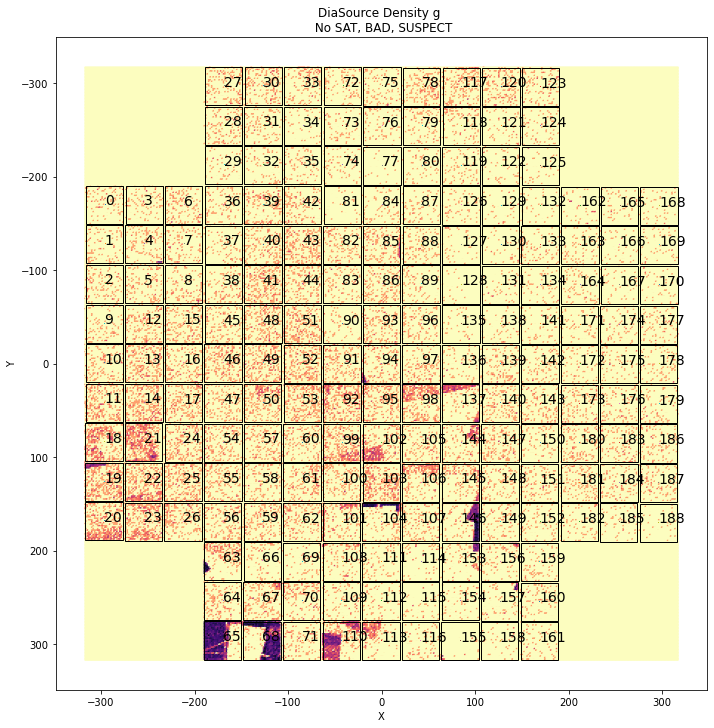

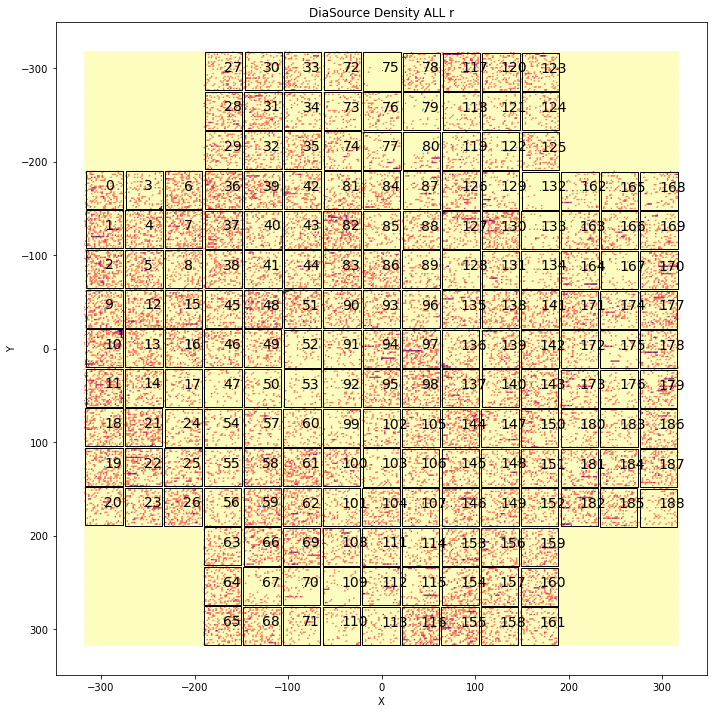

...

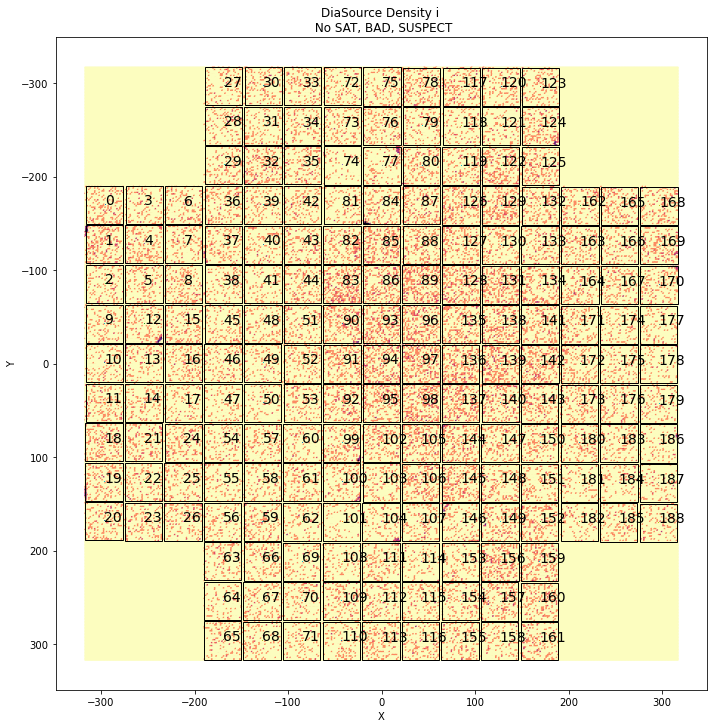

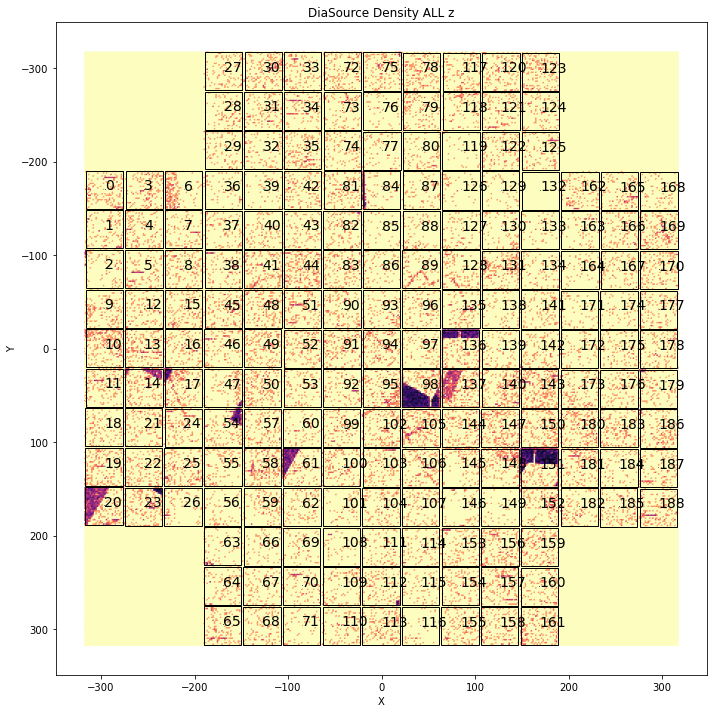

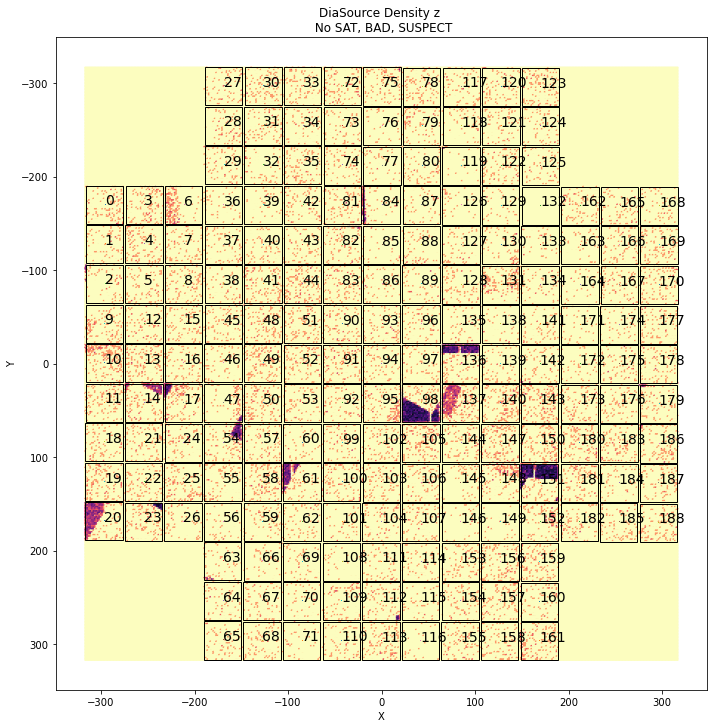

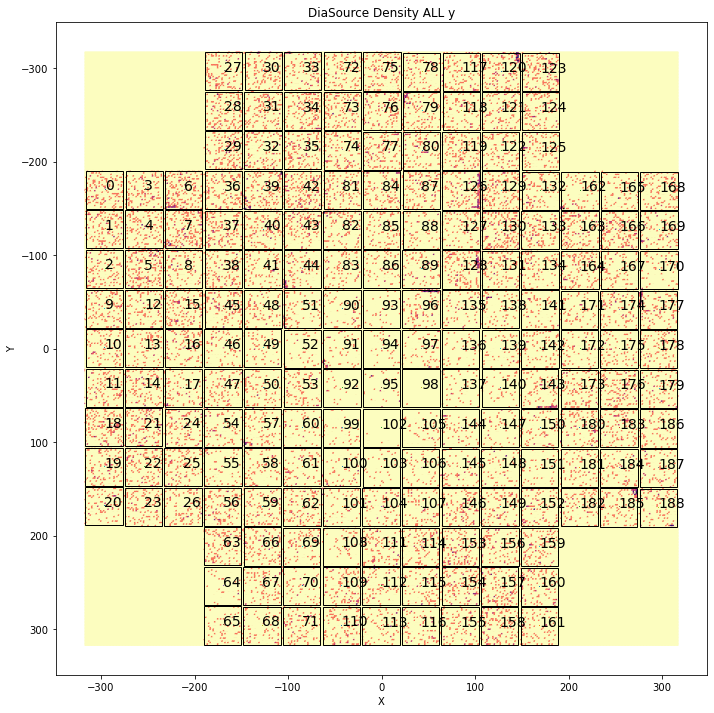

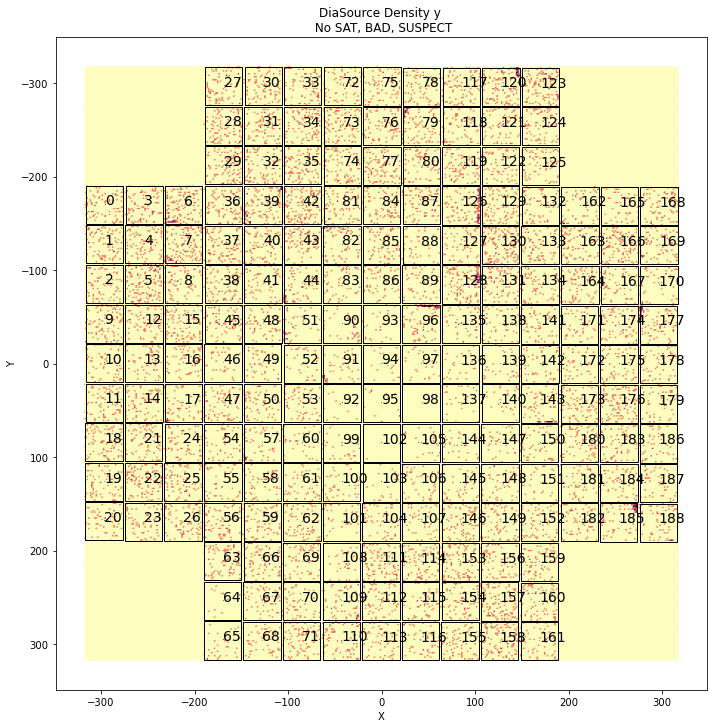

In [30]:
import matplotlib.patches as patches
for band in 'ugrizy':
    fig1 = plt.figure(figsize=(12,12))
    ax1 = fig1.add_subplot(111, aspect='equal')
    for index, row in corners.iterrows():
        ax1.add_patch(
        patches.Rectangle((row[7], row[6]), - row.height, -row.width, fill=False))
        ax1.text(row[7]-row.height/2, row[6]-row.width/2, '%d'%(row[1]), fontsize=14)
        plt.plot(row[7]-row.height/2, row[6]-row.width/2, ',')
    ax1.hexbin(ds[ds.filterName == band]['yFP'], ds[ds.filterName == band]['xFP'], gridsize=(400,400), bins='log', cmap='magma_r')
    ax1.set_title('DiaSource Density ALL %s' %(band))
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1 = plt.gca()
    ax1.invert_yaxis()
    plt.show()

    for ind, title in [
                       (idx, "No SAT, BAD, SUSPECT"),
    ]:

        fig1 = plt.figure(figsize=(12,12))
        ax1 = fig1.add_subplot(111, aspect='equal')
        for index, row in corners.iterrows():
            ax1.add_patch(
            patches.Rectangle((row[7], row[6]), - row.height, -row.width, fill=False))
            ax1.text(row[7]-row.height/2, row[6]-row.width/2, '%d'%(row[1]), fontsize=14)
            plt.plot(row[7]-row.height/2, row[6]-row.width/2, ',')
        ax1.hexbin(ds[(ds.filterName == band) & idx]['yFP'], ds[(ds.filterName == band) & idx]['xFP'], gridsize=(400,400), bins='log', cmap='magma_r')
        ax1.set_title('DiaSource Density %s \n %s' %(band, title))
        ax1.set_xlabel('X')
        ax1.set_ylabel('Y')
        ax1 = plt.gca()
        ax1.invert_yaxis()
        plt.show()

See appendix for visit ccd combos:

<ipython-input-31-5989ea677c06>:4: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  ax.hexbin(ds.x[~ds['base_PixelFlags_flag_bad']],


(-204.80000450560004, 4300.800004505601, -204.8, 4300.8)

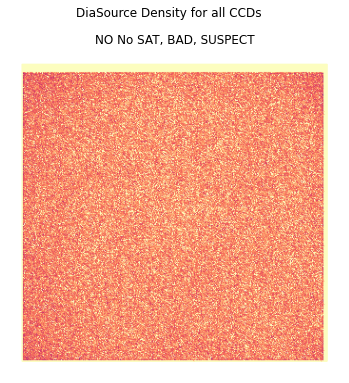

In [31]:
fig = plt.figure(figsize=(6, 6))
fig.suptitle('DiaSource Density for all CCDs')
ax = fig.add_subplot(1,1,1)
ax.hexbin(ds.x[~ds['base_PixelFlags_flag_bad']],
          ds.y[~ds['base_PixelFlags_flag_bad']], gridsize=(320,320), bins='log',
          extent= [0,4096,0,4096], cmap='magma_r',  vmin=1, vmax=100)
ax.set_title('NO %s' %title)
plt.axis('off')

In [32]:
ds['date_time'] = pd.to_datetime(ds.midPointTai, unit='D', origin=pd.Timestamp('1858-11-17'))
ds['date'] = ds['date_time'].dt.date


In [33]:
night_count = ds.groupby(['visit','date']).count()

# DiaSources per night


In [34]:
visits_per_night = night_count.groupby('date').count()
dia_per_night = night_count.groupby('date').sum()
pervisit_per_night = night_count.groupby('date').mean()
pervisit_per_night_std = night_count.groupby('date').std()

In [35]:
per_night = pd.merge(visits_per_night['x'], dia_per_night['x'], right_index=True, left_index=True)

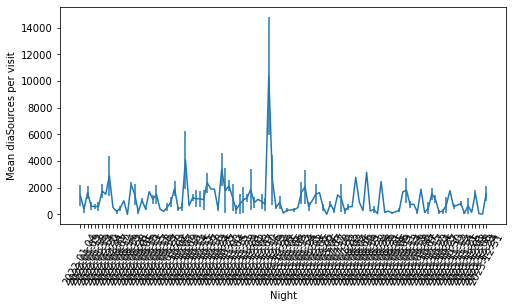

(0.0, 20.0)

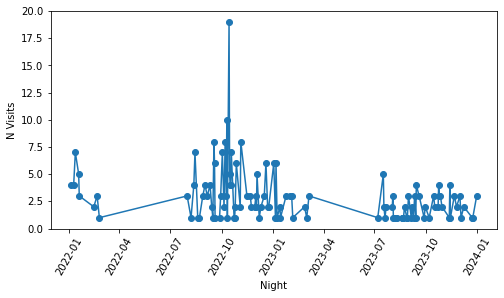

In [36]:
plt.figure(figsize=(8,4))
plt.errorbar(pervisit_per_night.index.values.astype('str'), pervisit_per_night['x'],
             yerr=pervisit_per_night_std['x']/np.sqrt(visits_per_night['x']))
#plt.xticks(pervisit_per_night.index.values.astype('str'))
_ = plt.xticks(rotation=60)
plt.xlabel('Night')
plt.ylabel('Mean diaSources per visit')
plt.show()
plt.figure(figsize=(8,4))
plt.plot(visits_per_night.index, visits_per_night['x'], 'o-')
_ = plt.xticks(rotation=60)
plt.xlabel('Night')
plt.ylabel('N Visits')
plt.ylim(0, np.max(visits_per_night['x'].values + 1))


# Images of the visit-detectors with most and fewest diaSources

In [37]:
for band in 'ugrizy':
    countsDF = ds[ds.filterName == band].groupby(['ccdVisitId', 'visit', 'detector']).count().reset_index()
    print("%s band" % band)
    print(countsDF.sort_values('x')[['visit', 'detector', 'x']].head(3))
    print(countsDF.sort_values('x')[['visit', 'detector', 'x']].tail(3))
    print("-------------------")

u band
      visit  detector  x
575  431193        27  1
55     2337        85  1
415  235058       151  1
      visit  detector    x
18     2336        45  285
501  277061        43  641
20     2336        47  684
-------------------
g band
      visit  detector  x
768  466279        53  1
714  419000        12  1
864  484266       134  2
      visit  detector      x
593  254381       104   4015
499  254379        68   8766
496  254379        65  10498
-------------------
r band
      visit  detector  x
593  213545        14  1
174  193233        76  1
708  242505        50  1
      visit  detector    x
531  212739       178  151
917  414873       117  154
107  193189        10  169
-------------------
i band
       visit  detector  x
273   211140        20  1
2191  457749       149  1
1871  397330        74  1
       visit  detector    x
813   214464        84  135
2059  433992       122  145
812   214464        83  158
-------------------
z band
      visit  detector  x
871  474890 

In [43]:
masks = {'BAD': 'red',
         'CR': 'magenta',
         'EDGE': 'yellow',
         'SAT': 'green',
         'DETECTED': 'blue',
         'DETECTED_NEGATIVE': 'cyan',
         'NO_DATA': 'orange',
         'INTERPOLATED': 'magenta'
        }

In [38]:
def displayDiff(visit, detector, frame):
        display1 = afw_display.Display(frame=frame, backend='matplotlib')
        display1.scale("linear", "zscale")
        display1.setDefaultMaskTransparency(90)
        display1.setMaskPlaneColor(masks)
        print("visit=%s, detector=%s"%(visit,detector))
        dataId = dict(visit=visit, detector=detector)
        exp = butler.get('goodSeeingDiff_differenceExp', dataId=dataId)
        exp.image.array[:] = gaussian(exp.image.array, sigma=3)
        cat = butler.get('goodSeeingDiff_diaSrc', dataId=dataId)
        display1.mtv(exp)
        with display1.Buffering():
            for record in cat:
                if (
                    record['base_PixelFlags_flag_offimage'] |
                    record['base_PixelFlags_flag_edge'] |
                    record['base_PixelFlags_flag_interpolated'] | 
                    record['base_PixelFlags_flag_saturated'] | 
                    record['base_PixelFlags_flag_cr'] | 
                    record['base_PixelFlags_flag_bad'] | 
                    record['base_PixelFlags_flag_suspect'] | 
                    record['base_PixelFlags_flag_interpolatedCenter'] | 
                    record['base_PixelFlags_flag_saturatedCenter'] | 
                    record['base_PixelFlags_flag_crCenter'] | 
                    record['base_PixelFlags_flag_suspectCenter'] 
                     ):
                    display1.dot('+', record.getX(), record.getY(), size=20, ctype='red')
                elif record.getFootprint().getArea() > 1000:
                    display1.dot('+', record.getX(), record.getY(), size=20, ctype='orange')
                else:
                    display1.dot('o', record.getX(), record.getY(), size=20, ctype='yellow')
        display1.show()

g band
      visit  detector  x
768  466279        53  1
714  419000        12  1
864  484266       134  2
      visit  detector      x
593  254381       104   4015
499  254379        68   8766
496  254379        65  10498
-------------------
visit=254381, detector=104
visit=254379, detector=68
visit=254379, detector=65
visit=466279, detector=53
visit=419000, detector=12
visit=484266, detector=134


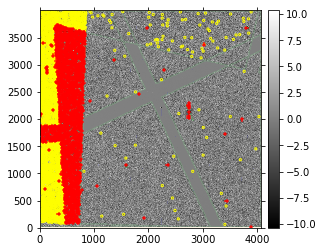

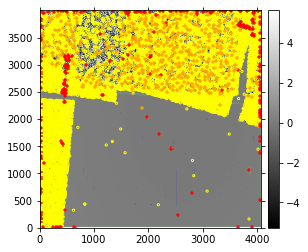

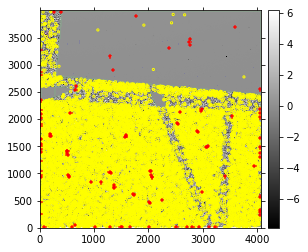

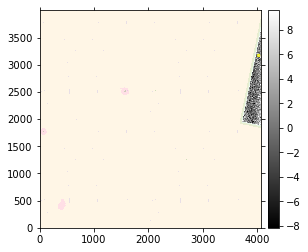

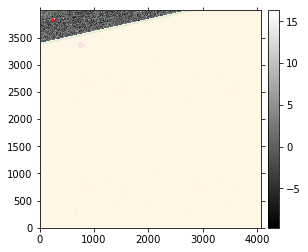

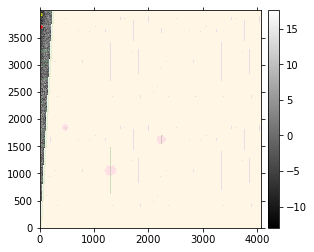

In [44]:
N = 3
for band in 'g':
    countsDF = ds[ds.filterName == band].groupby(['ccdVisitId', 'visit', 'detector']).count().reset_index()
    sortedCounts = countsDF.sort_values('x')[['visit', 'detector', 'x']]
    print("%s band" % band)
    print(countsDF.sort_values('x')[['visit', 'detector', 'x']].head(3))
    print(countsDF.sort_values('x')[['visit', 'detector', 'x']].tail(3))
    print("-------------------")
    for i, row in enumerate(sortedCounts.tail(N).iterrows()):
        visit=row[1].visit
        detector=row[1].detector
        displayDiff(visit, detector, frame=i+1)
    for i, row in enumerate(sortedCounts.head(N).iterrows()):
        visit=row[1].visit
        detector=row[1].detector
        displayDiff(visit, detector, frame=i+N+1)
 

z band
      visit  detector  x
871  474890        33  1
192   13287        31  1
62     7998       135  1
      visit  detector     x
297  209015       136  2700
307  209015       151  6722
285  209015        98  6958
-------------------
visit=209015, detector=136
visit=209015, detector=151
visit=209015, detector=98
visit=474890, detector=33
visit=13287, detector=31
visit=7998, detector=135


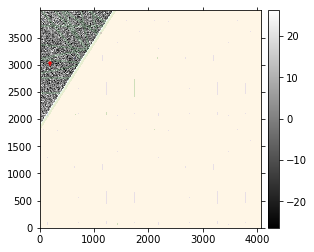

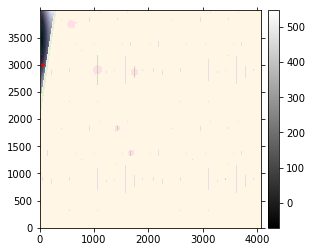

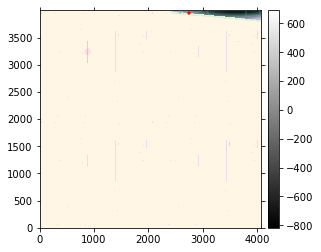

In [45]:
N = 3
for band in 'z':
    countsDF = ds[ds.filterName == band].groupby(['ccdVisitId', 'visit', 'detector']).count().reset_index()
    sortedCounts = countsDF.sort_values('x')[['visit', 'detector', 'x']]
    print("%s band" % band)
    print(countsDF.sort_values('x')[['visit', 'detector', 'x']].head(3))
    print(countsDF.sort_values('x')[['visit', 'detector', 'x']].tail(3))
    print("-------------------")
    for i, row in enumerate(sortedCounts.tail(N).iterrows()):
        visit=row[1].visit
        detector=row[1].detector
        displayDiff(visit, detector, frame=i+1)
    for i, row in enumerate(sortedCounts.head(N).iterrows()):
        visit=row[1].visit
        detector=row[1].detector
        displayDiff(visit, detector, frame=i+1+N)

## Interactive Display

In [ ]:
afwDisplay.setDefaultBackend('firefly')
display = afwDisplay.Display(backend='firefly', url='http://lsst-demo.ncsa.illinois.edu/firefly')
display.getClient().get_firefly_url()

In [ ]:
visit=433992; detector=122
visit=2336; detector=47
dataId = dict(tract=3828, band='z', patch=9)
exp = butler.get('goodSeeingCoadd_nImage', dataId=dataId)
#cat = butler.get('goodSeeingDiff_diaSrc', dataId=dataId)
display.mtv(exp)

In [ ]:
with display.Buffering():
    for record in cat:
        if (record['base_PixelFlags_flag_interpolated']):
            display.dot('o', record.getX(), record.getY(), size=20, ctype='magenta')
        if ( record['base_PixelFlags_flag_cr'] 
           ):
            display.dot('x', record.getX(), record.getY(), size=20, ctype='magenta')
        if (record['base_PixelFlags_flag_saturated']  
           ):
            display.dot('*', record.getX(), record.getY(), size=20, ctype='orange')
        if(
            record['base_PixelFlags_flag_offimage'] |
            record['base_PixelFlags_flag_edge'] |
            record['base_PixelFlags_flag_bad'] | 
            record['base_PixelFlags_flag_suspect']
            ):
            display.dot('*', record.getX(), record.getY(), size=20, ctype='red')
        if record.getFootprint().getArea() > 1000:
            display.dot('+', record.getX(), record.getY(), size=20, ctype='orange')


In [ ]:
display.erase()

In [ ]:

dataId = dict(visit=visit, detector=detector)
exp = butler.get('goodSeeingCoadd_nImage', dataId=dict(tract=3829, patch=1, band='u'))

#cat = butler.get('goodSeeingDiff_diaSrc', dataId=dataId)
display.mtv(exp)


In [ ]:
butler.get('goodSeeingVisits', dataId=dict(tract=3829, patch=1, band='u'))

In [ ]:
display.setMaskTransparency(50)
display.scale("linear", "zscale")

## Per-visit diaSources

In [ ]:
#PER VISIT
for v in np.unique(ds[ds.filterName=='z']['visit'].values):
    ind = ds.visit == v
    fig1 = plt.figure(figsize=(14, 8))
    ax1 = fig1.add_subplot(121, aspect='equal')
    ax1.hexbin(ds.yFP[ind], ds.xFP[ind], gridsize=(100,100), bins='log', cmap='magma_r')
    for index, row in corners.iterrows():
        ax1.add_patch( patches.Rectangle((row[7], row[6]), - row.height, -row.width, fill=False))
        ax1.text(row[7]-row.height/2, row[6]-row.width/2, '%d'%(row[1]), fontsize=9, ha='center')
    ax1.set_title('DiaSource Density visit =  %s' % v)
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1 = plt.gca()
    ax1.invert_yaxis()
    
    ax1 = fig1.add_subplot(122, aspect='equal')
    #for index, row in corners.iterrows():
    #    ax1.add_patch( patches.Rectangle((row[7], row[6]), - row.height, -row.width, fill=False))
    #    ax1.text(row[7]-row.height/2, row[6]-row.width/2, '%d'%(row[1]), fontsize=14)
    ax1.hexbin(ds.ra[ind], ds.decl[ind], gridsize=(150,150), bins='log', cmap='magma_r')
    ax1.set_title('DiaSource Density visit = %s' % v)
    ax1.set_xlabel('RA')
    ax1.set_ylabel('Decl')
    ax1 = plt.gca()
    ax1.invert_xaxis()
    plt.show()
